In [1]:
import numpy as np
import matplotlib.pyplot as plt
from src.cluster.cluster import *
import os
import pandas as pd
from src.test.evaluate import *
from src.test.display_npy import *
from src.helper_functions import *
from src.data.preprocess import *
from src.data.full_mosaic_processing import *
import pandas as pd
from tqdm import tqdm
import rasterio
import pyproj
import cv2
import rasterio
from reproject_hapke import *


/home/kinreich/autoencoder_project/.pixi/envs/default/lib/python3.11/site-packages/cupy/_environment.py:663: UserWarning: 
--------------------------------------------------------------------------------

  CuPy may not function correctly because multiple CuPy packages are installed
  in your environment:

    cupy, cupy-cuda12x

  Follow these steps to resolve this issue:

    1. For all packages listed above, run the following command to remove all
       existing CuPy installations:

         $ pip uninstall <package_name>

      If you previously installed CuPy via conda, also run the following:

         $ conda uninstall cupy

    2. Install the appropriate CuPy package.
       Refer to the Installation Guide for detailed instructions.

         https://docs.cupy.dev/en/stable/install.html

--------------------------------------------------------------------------------

  warnings.warn(f'''


RAPIDS cuML imported successfully. GPU computations enabled.
RAPIDS cuML imported successfully. GPU computations enabled.


Loaded preview (1819, 5458), CRS=PROJCS["unknown",GEOGCS["unknown",DATUM["unknown",SPHEROID["unknown",1737400,0]],PRIMEM["Reference meridian",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Equirectangular"],PARAMETER["standard_parallel_1",0],PARAMETER["central_meridian",0],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
Total in lat/diam window : 152103
  dropped (in band)      : 44801
  kept                   : 107302


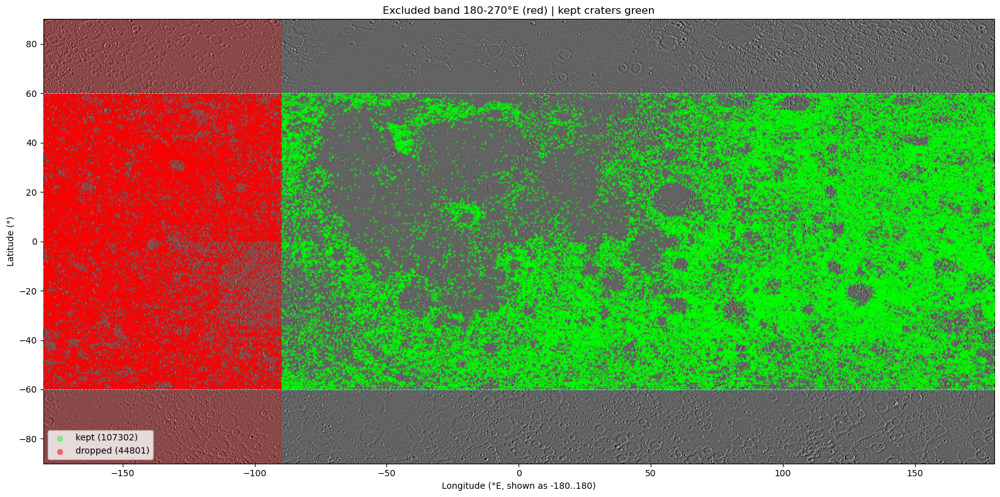

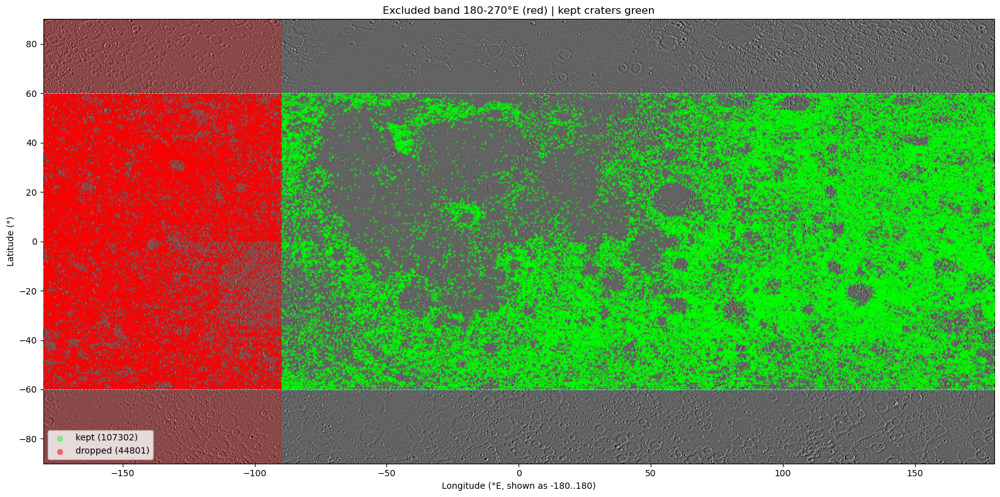

In [3]:
# ── Visualize the excluded longitude band ──────────────────────────────────
%matplotlib inline
import matplotlib
matplotlib.use('module://matplotlib_inline.backend_inline')
import numpy as np
import pandas as pd
import rasterio
from rasterio.enums import Resampling
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# ── config (match your run) ────────────────────────────────────────────────
MAP_FILE      = "data/raw/wac_mosaic_new_version/sigma/100/highpass_filtered_lunar_mosaic.tif"  # your TIFF
CRATERS_CSV   = "data/raw/lunar_crater_database_robbins_2018.csv"          # Robbins catalog
EXCLUDE_LON   = (180.0, 270.0)         # degrees East, the band you're dropping
LAT_BOUNDS    = (-60.0, 60.0)
DIAM_BOUNDS   = (3.0, 10.0)
DOWNSAMPLE    = 20                      # read the TIFF at 1/N res so it fits in RAM

def to_360(lon):
    return lon % 360.0

# ── 1. read a downsampled version of the mosaic ────────────────────────────
with rasterio.open(MAP_FILE) as src:
    out_h = src.height // DOWNSAMPLE
    out_w = src.width  // DOWNSAMPLE
    img = src.read(
        1,
        out_shape=(out_h, out_w),
        resampling=Resampling.average,
    )
    bounds = src.bounds            # in the mosaic's projected/native units
    crs    = src.crs
print(f"Loaded preview {img.shape}, CRS={crs}")

# ── 2. load + filter craters exactly like the pipeline ─────────────────────
craters = pd.read_csv(CRATERS_CSV)
f = craters[
    (craters['DIAM_CIRC_IMG'] >= DIAM_BOUNDS[0]) &
    (craters['DIAM_CIRC_IMG'] <= DIAM_BOUNDS[1]) &
    (craters['LAT_CIRC_IMG']  >= LAT_BOUNDS[0]) &
    (craters['LAT_CIRC_IMG']  <= LAT_BOUNDS[1])
].copy()

lon360 = to_360(f['LON_CIRC_IMG'])
lo, hi = to_360(EXCLUDE_LON[0]), to_360(EXCLUDE_LON[1])
if lo <= hi:
    in_band = (lon360 >= lo) & (lon360 <= hi)
else:
    in_band = (lon360 >= lo) | (lon360 <= hi)

f['lon360']  = lon360
f['dropped'] = in_band
print(f"Total in lat/diam window : {len(f)}")
print(f"  dropped (in band)      : {in_band.sum()}")
print(f"  kept                   : {(~in_band).sum()}")

# ── 3. plot in simple lon/lat space (catalog coords) ───────────────────────
# Map the preview image onto a -180..180 / -90..90 lon-lat axis so the
# crater longitudes line up regardless of the TIFF's native projection.
fig, ax = plt.subplots(figsize=(16, 8))
ax.imshow(img, cmap='gray', extent=[-180, 180, -90, 90],
          origin='upper', aspect='auto')

# excluded band -> draw in -180..180 space (may wrap into two rectangles)
def lon_to_pm180(x):
    return ((x + 180) % 360) - 180

def add_band(ax, lo360, hi360, **kw):
    # split into segments that don't cross the 180 wrap
    segs = []
    if lo360 <= hi360:
        segs.append((lo360, hi360))
    else:
        segs.append((lo360, 360))
        segs.append((0, hi360))
    for a, b in segs:
        a180, b180 = lon_to_pm180(a), lon_to_pm180(b)
        if a180 > b180:                      # segment itself wraps
            ax.add_patch(Rectangle((a180, -90), 180 - a180, 180, **kw))
            ax.add_patch(Rectangle((-180, -90), b180 + 180, 180, **kw))
        else:
            ax.add_patch(Rectangle((a180, -90), b180 - a180, 180, **kw))

add_band(ax, lo, hi, color='red', alpha=0.25, zorder=2)

kept = f[~f['dropped']]
drop = f[f['dropped']]
ax.scatter(lon_to_pm180(kept['lon360']), kept['LAT_CIRC_IMG'],
           s=2, c='lime',   alpha=0.4, label=f'kept ({len(kept)})',    zorder=3)
ax.scatter(lon_to_pm180(drop['lon360']), drop['LAT_CIRC_IMG'],
           s=2, c='red',    alpha=0.5, label=f'dropped ({len(drop)})', zorder=4)

# lat cutoffs
for y in LAT_BOUNDS:
    ax.axhline(y, color='cyan', lw=0.8, ls='--', zorder=5)

ax.set_xlabel('Longitude (°E, shown as -180..180)')
ax.set_ylabel('Latitude (°)')
ax.set_title(f'Excluded band {EXCLUDE_LON[0]:.0f}-{EXCLUDE_LON[1]:.0f}°E '
             f'(red) | kept craters green')
ax.legend(loc='lower left', markerscale=4)
ax.set_xlim(-180, 180); ax.set_ylim(-90, 90)
plt.tight_layout()
plt.show()

In [3]:
# Path to your combined craters .npy memmap
npy_path = "data/processed_wac_emnorm/craters.npy"  # adjust for mae/cae

# Check if file exists
if not os.path.exists(npy_path):
    print("File not found:", npy_path)
else:
    # Open memmap
    crater_memmap = np.memmap(npy_path, mode='r', dtype=np.float32)
    
    # Each crater is stored as (channels, 224, 224)
    channels, H, W = 1, 224, 224  # adjust for mae: channels=3
    
    # Compute total number of craters
    total_craters = crater_memmap.size // (channels * H * W)
    print(f"Memmap size (bytes): {crater_memmap.size * crater_memmap.dtype.itemsize}")
    print(f"Number of craters in memmap: {total_craters}")


Memmap size (bytes): 205087977472
Number of craters in memmap: 1021843


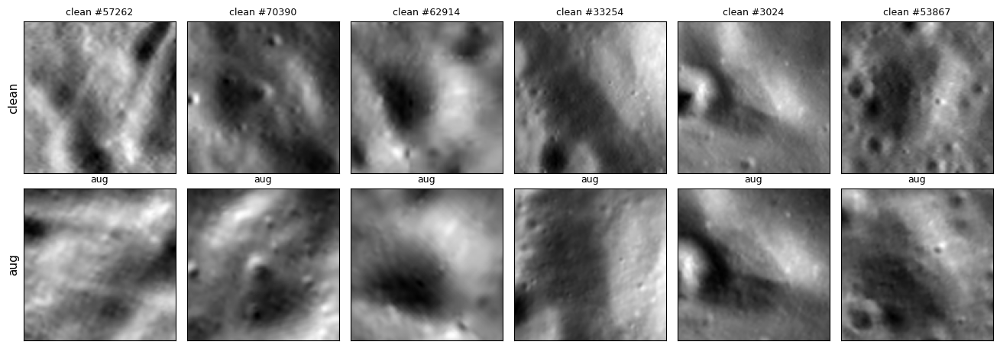

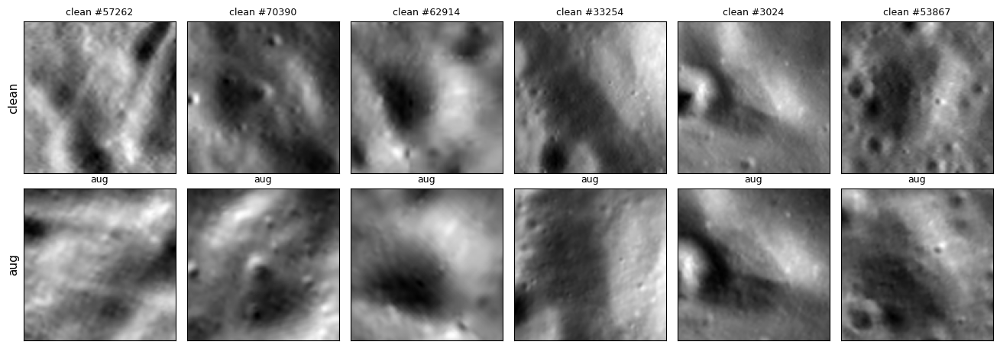

In [4]:
# ── Inspect clean vs augmented crops ───────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt

OUTPUT_SIZE  = 128
NUM_CHANNELS = 1
N_SHOW       = 6

clean = np.memmap("data/processed_wac_100m_new/sigma/100/test_rotate/without_left_band/craters_clean.dat", dtype=np.float32, mode="r",
                  shape=(152103 - 44801, NUM_CHANNELS, OUTPUT_SIZE, OUTPUT_SIZE))  # adjust N
aug   = np.memmap("data/processed_wac_100m_new/sigma/100/test_rotate/without_left_band/craters_aug.dat",   dtype=np.float32, mode="r",
                  shape=clean.shape)

idx = np.random.choice(len(clean), N_SHOW, replace=False)

fig, axes = plt.subplots(2, N_SHOW, figsize=(2.2*N_SHOW, 4.6))
for col, i in enumerate(idx):
    axes[0, col].imshow(clean[i, 0], cmap='gray', vmin=0, vmax=1)
    axes[0, col].set_title(f'clean #{i}', fontsize=9)
    axes[1, col].imshow(aug[i, 0],   cmap='gray', vmin=0, vmax=1)
    axes[1, col].set_title('aug', fontsize=9)
    for ax in (axes[0, col], axes[1, col]):
        ax.set_xticks([]); ax.set_yticks([])
axes[0,0].set_ylabel('clean', fontsize=11)
axes[1,0].set_ylabel('aug',   fontsize=11)
plt.tight_layout()
fig.savefig('aug_preview.png', dpi=110, bbox_inches='tight')
fig

Memmap size (bytes): 205087977472
Number of craters in memmap: 1021843

Visualizing random samples...


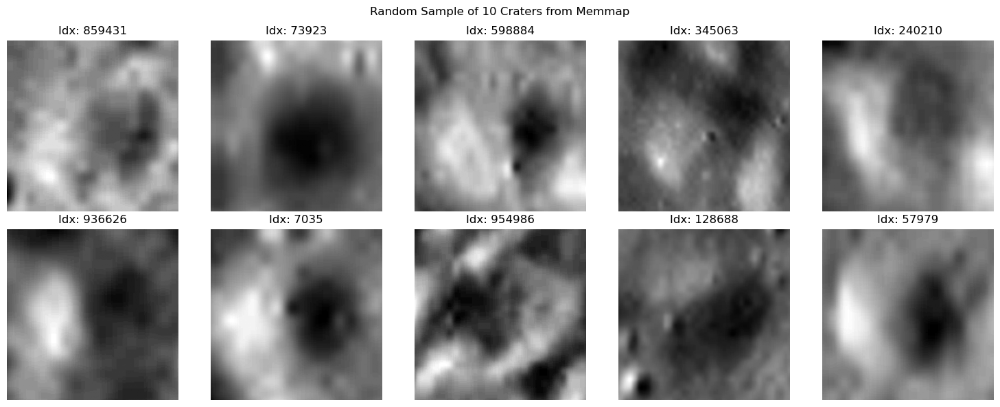

In [37]:
# Path to your combined craters .npy memmap
npy_path = "data/processed/cae/craters.npy"  # adjust for mae/cae

# Check if file exists
if not os.path.exists(npy_path):
    print("File not found:", npy_path)
else:
    # Open memmap
    # NOTE: If this was saved using np.save(), consider using: np.load(npy_path, mmap_mode='r')
    crater_memmap = np.memmap(npy_path, mode='r', dtype=np.float32)
    
    # Each crater is stored as (channels, 224, 224)
    channels, H, W = 1, 224, 224  # adjust for mae: channels=3
    
    # Compute total number of craters
    total_craters = crater_memmap.size // (channels * H * W)
    print(f"Memmap size (bytes): {crater_memmap.size * crater_memmap.dtype.itemsize}")
    print(f"Number of craters in memmap: {total_craters}")

    # --- NEW CODE START: Display 10 Craters ---
    if total_craters > 0:
        print("\nVisualizing random samples...")
        
        # Reshape the linear memmap to access individual images: (N, C, H, W)
        # We slice [:total*...] to ensure we don't include partial/garbage bytes at the end
        craters = crater_memmap[:total_craters * channels * H * W].reshape(total_craters, channels, H, W)

        # Select 10 random indices (or all if less than 10)
        num_samples = 10
        if total_craters < num_samples:
            indices = np.arange(total_craters)
        else:
            indices = np.random.choice(total_craters, num_samples, replace=False)

        # Create plot
        fig, axes = plt.subplots(2, 5, figsize=(15, 6))
        axes = axes.ravel()

        for i, idx in enumerate(indices):
            # Extract image. Shape is (C, H, W) -> e.g., (1, 224, 224)
            img = craters[idx]
            
            # Prepare for Matplotlib (needs H, W, C or just H, W)
            if channels == 1:
                img_disp = img.squeeze()  # Becomes (224, 224)
                cmap = 'gray'
            else:
                img_disp = np.transpose(img, (1, 2, 0))  # Becomes (224, 224, 3)
                cmap = None

            # Handle Float32 Display: 
            # If values are not 0-1, imshow normalizes automatically. 
            # If you want to force it, uncomment the next line:
            # img_disp = (img_disp - img_disp.min()) / (img_disp.max() - img_disp.min())

            axes[i].imshow(img_disp, cmap=cmap)
            axes[i].set_title(f"Idx: {idx}")
            axes[i].axis('off')

        plt.suptitle(f"Random Sample of {num_samples} Craters from Memmap")
        plt.tight_layout()
        plt.show()
    else:
        print("Memmap is empty or dimensions are incorrect.")

Memmap size (bytes): 205087977472
Number of craters in memmap: 1021843

Visualizing random samples...


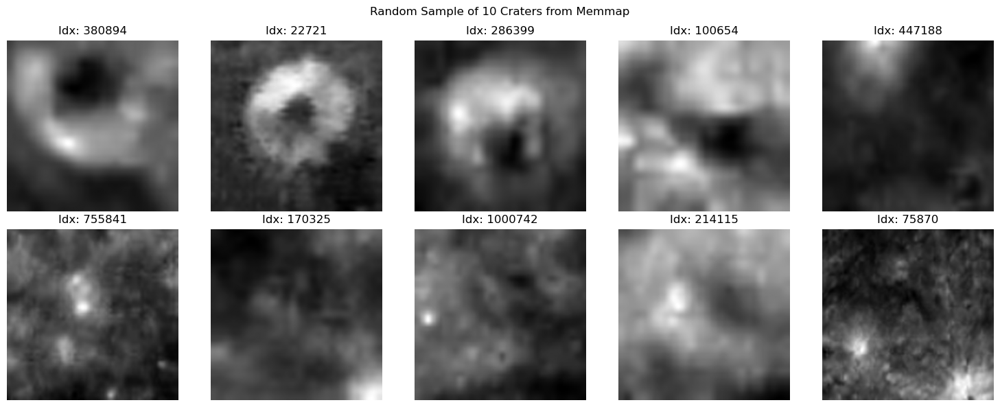

In [42]:
# Path to your combined craters .npy memmap
npy_path = "data/processed_wac_emnorm/craters.npy"  # adjust for mae/cae

# Check if file exists
if not os.path.exists(npy_path):
    print("File not found:", npy_path)
else:
    # Open memmap
    # NOTE: If this was saved using np.save(), consider using: np.load(npy_path, mmap_mode='r')
    crater_memmap = np.memmap(npy_path, mode='r', dtype=np.float32)
    
    # Each crater is stored as (channels, 224, 224)
    channels, H, W = 1, 224, 224  # adjust for mae: channels=3
    
    # Compute total number of craters
    total_craters = crater_memmap.size // (channels * H * W)
    print(f"Memmap size (bytes): {crater_memmap.size * crater_memmap.dtype.itemsize}")
    print(f"Number of craters in memmap: {total_craters}")

    # --- NEW CODE START: Display 10 Craters ---
    if total_craters > 0:
        print("\nVisualizing random samples...")
        
        # Reshape the linear memmap to access individual images: (N, C, H, W)
        # We slice [:total*...] to ensure we don't include partial/garbage bytes at the end
        craters = crater_memmap[:total_craters * channels * H * W].reshape(total_craters, channels, H, W)

        # Select 10 random indices (or all if less than 10)
        num_samples = 10
        if total_craters < num_samples:
            indices = np.arange(total_craters)
        else:
            indices = np.random.choice(total_craters, num_samples, replace=False)

        # Create plot
        fig, axes = plt.subplots(2, 5, figsize=(15, 6))
        axes = axes.ravel()

        for i, idx in enumerate(indices):
            # Extract image. Shape is (C, H, W) -> e.g., (1, 224, 224)
            img = craters[idx]
            
            # Prepare for Matplotlib (needs H, W, C or just H, W)
            if channels == 1:
                img_disp = img.squeeze()  # Becomes (224, 224)
                cmap = 'gray'
            else:
                img_disp = np.transpose(img, (1, 2, 0))  # Becomes (224, 224, 3)
                cmap = None

            # Handle Float32 Display: 
            # If values are not 0-1, imshow normalizes automatically. 
            # If you want to force it, uncomment the next line:
            # img_disp = (img_disp - img_disp.min()) / (img_disp.max() - img_disp.min())

            axes[i].imshow(img_disp, cmap=cmap)
            axes[i].set_title(f"Idx: {idx}")
            axes[i].axis('off')

        plt.suptitle(f"Random Sample of {num_samples} Craters from Memmap")
        plt.tight_layout()
        plt.show()
    else:
        print("Memmap is empty or dimensions are incorrect.")

In [45]:
import numpy as np
import pandas as pd

craters = pd.read_csv("data/processed_wac_emnorm/metadata.csv")
filtered = craters[
    (craters['diam'] >= 3000) &
    (craters['diam'] <= 10000) &
    (craters['lat'] >= -60) &
    (craters['lat'] <= 60)
]
print(f"Craters in 3-10km range: {len(filtered)}")

Craters in 3-10km range: 152103


Memmap size (bytes): 30527680512
Number of craters in memmap: 152103

Visualizing random samples...


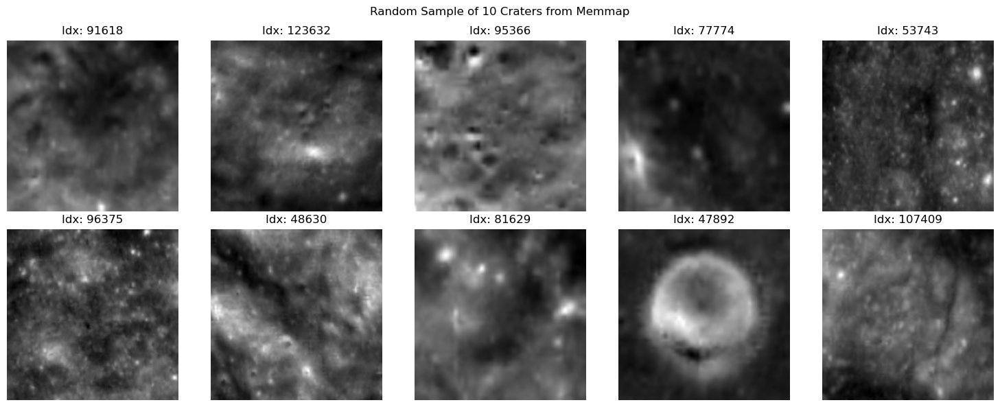

In [54]:
# Path to your combined craters .npy memmap
npy_path = "data/processed_wac_emnorm_3_10/craters.npy"  # adjust for mae/cae

# Check if file exists
if not os.path.exists(npy_path):
    print("File not found:", npy_path)
else:
    # Open memmap
    # NOTE: If this was saved using np.save(), consider using: np.load(npy_path, mmap_mode='r')
    crater_memmap = np.memmap(npy_path, mode='r', dtype=np.float32)
    
    # Each crater is stored as (channels, 224, 224)
    channels, H, W = 1, 224, 224  # adjust for mae: channels=3
    
    # Compute total number of craters
    total_craters = crater_memmap.size // (channels * H * W)
    print(f"Memmap size (bytes): {crater_memmap.size * crater_memmap.dtype.itemsize}")
    print(f"Number of craters in memmap: {total_craters}")

    # --- NEW CODE START: Display 10 Craters ---
    if total_craters > 0:
        print("\nVisualizing random samples...")
        
        # Reshape the linear memmap to access individual images: (N, C, H, W)
        # We slice [:total*...] to ensure we don't include partial/garbage bytes at the end
        craters = crater_memmap[:total_craters * channels * H * W].reshape(total_craters, channels, H, W)

        # Select 10 random indices (or all if less than 10)
        num_samples = 10
        if total_craters < num_samples:
            indices = np.arange(total_craters)
        else:
            indices = np.random.choice(total_craters, num_samples, replace=False)

        # Create plot
        fig, axes = plt.subplots(2, 5, figsize=(15, 6))
        axes = axes.ravel()

        for i, idx in enumerate(indices):
            # Extract image. Shape is (C, H, W) -> e.g., (1, 224, 224)
            img = craters[idx]
            
            # Prepare for Matplotlib (needs H, W, C or just H, W)
            if channels == 1:
                img_disp = img.squeeze()  # Becomes (224, 224)
                cmap = 'gray'
            else:
                img_disp = np.transpose(img, (1, 2, 0))  # Becomes (224, 224, 3)
                cmap = None

            # Handle Float32 Display: 
            # If values are not 0-1, imshow normalizes automatically. 
            # If you want to force it, uncomment the next line:
            # img_disp = (img_disp - img_disp.min()) / (img_disp.max() - img_disp.min())

            axes[i].imshow(img_disp, cmap=cmap)
            axes[i].set_title(f"Idx: {idx}")
            axes[i].axis('off')

        plt.suptitle(f"Random Sample of {num_samples} Craters from Memmap")
        plt.tight_layout()
        plt.show()
    else:
        print("Memmap is empty or dimensions are incorrect.")

Old shape: (1021843, 1, 224, 224), New shape: (1021843, 1, 224, 224)
Indexes compared: [ 66966 748797  39498 736902 900581]


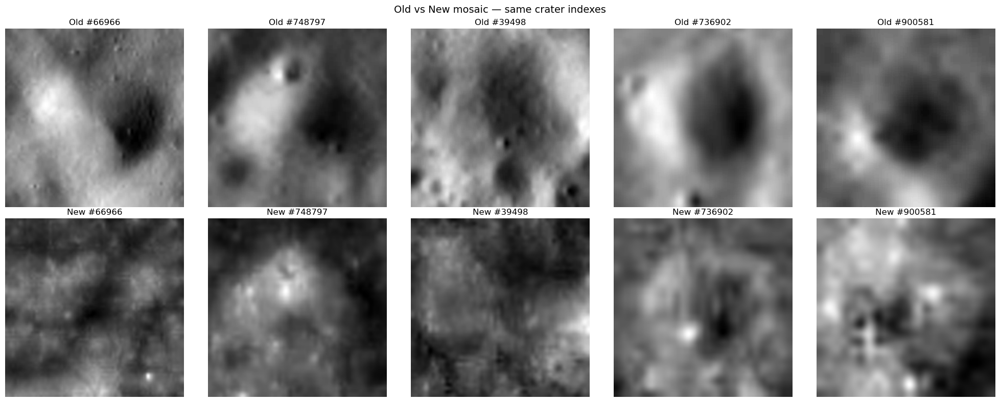

In [74]:
import numpy as np
import matplotlib.pyplot as plt

# Load both memmaps
N1 = 1021843

path_old = "data/processed/cae/craters.npy"
path_new = "data/processed_wac_emnorm/craters.npy"

n_old = os.path.getsize(path_old) // (1 * 224 * 224 * 4)
n_new = os.path.getsize(path_new) // (1 * 224 * 224 * 4)

old = np.memmap(path_old, dtype=np.float32, mode='r', shape=(n_old, 1, 224, 224))
new = np.memmap(path_new, dtype=np.float32, mode='r', shape=(n_new, 1, 224, 224))

# Pick 5 random indexes valid for both
idx = np.random.randint(0, min(n_old, n_new), size=5)

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
for col, i in enumerate(idx):
    axes[0, col].imshow(old[i, 0], cmap='gray')
    axes[0, col].set_title(f'Old #{i}')
    axes[0, col].axis('off')
    
    axes[1, col].imshow(new[i, 0], cmap='gray')
    axes[1, col].set_title(f'New #{i}')
    axes[1, col].axis('off')

axes[0, 0].set_ylabel('Old', fontsize=12)
axes[1, 0].set_ylabel('New', fontsize=12)

plt.suptitle('Old vs New mosaic — same crater indexes', fontsize=14)
plt.tight_layout()
plt.savefig('crater_comparison.png', dpi=150, bbox_inches='tight')
print(f"Old shape: {old.shape}, New shape: {new.shape}")
print(f"Indexes compared: {idx}")

Old shape: (1021843, 1, 224, 224), New shape: (1021843, 1, 224, 224)
Indexes compared: [163920 615753 426346 277266 563815]


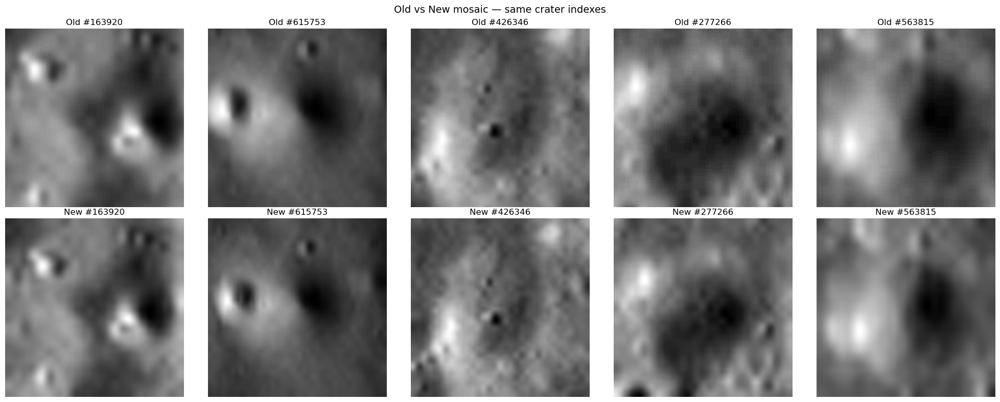

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Load both memmaps
N1 = 1021843

path_old = "data/processed/cae/craters.npy"
path_new = "data/processed_wac_100m_new/craters.npy"

n_old = os.path.getsize(path_old) // (1 * 224 * 224 * 4)
n_new = os.path.getsize(path_new) // (1 * 224 * 224 * 4)

old = np.memmap(path_old, dtype=np.float32, mode='r', shape=(n_old, 1, 224, 224))
new = np.memmap(path_new, dtype=np.float32, mode='r', shape=(n_new, 1, 224, 224))

# Pick 5 random indexes valid for both
idx = np.random.randint(0, min(n_old, n_new), size=5)

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
for col, i in enumerate(idx):
    axes[0, col].imshow(old[i, 0], cmap='gray')
    axes[0, col].set_title(f'Old #{i}')
    axes[0, col].axis('off')
    
    axes[1, col].imshow(new[i, 0], cmap='gray')
    axes[1, col].set_title(f'New #{i}')
    axes[1, col].axis('off')

axes[0, 0].set_ylabel('Old', fontsize=12)
axes[1, 0].set_ylabel('New', fontsize=12)

plt.suptitle('Old vs New mosaic — same crater indexes', fontsize=14)
plt.tight_layout()
plt.savefig('crater_comparison.png', dpi=150, bbox_inches='tight')
print(f"Old shape: {old.shape}, New shape: {new.shape}")
print(f"Indexes compared: {idx}")

In [77]:
craters = pd.read_csv("data/processed_wac_emnorm/metadata.csv")
big = craters[
    (craters['diam'] >= 7000) &
    (craters['diam'] <= 10000) &
    (craters['lat'] >= -30) &  # avoid high latitudes where projection distorts
    (craters['lat'] <= 30)
].iloc[0]
print(big[['id', 'lat', 'lon', 'diam']])

id      02-1-000919
lat         28.8183
lon        -161.724
diam        7967.02
Name: 122, dtype: object


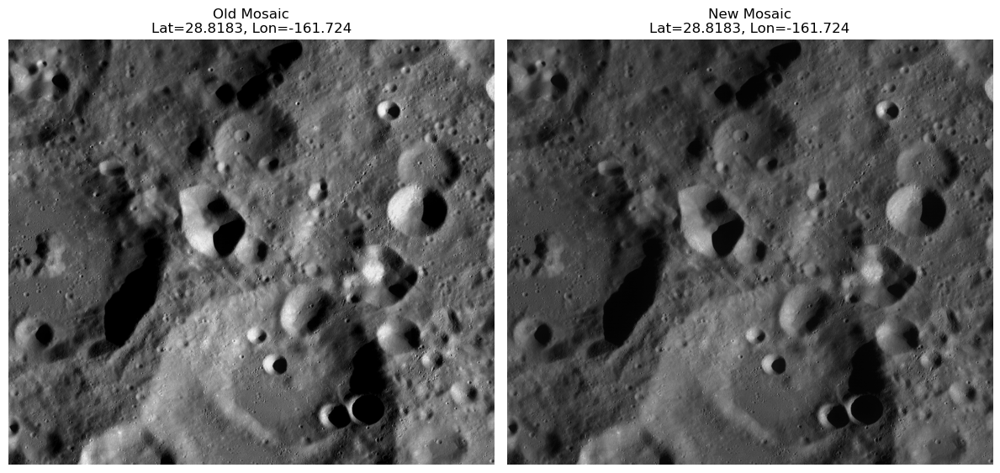

In [8]:
import pyproj
import rasterio
from rasterio.windows import from_bounds
from math import cos, radians
import matplotlib.pyplot as plt

# 1. Fixed diam_km (Assumed typo, maybe 79.67?)
diam_km = 79.67 
offset = 0.5
lon, lat = -161.724, 28.8183

def get_craters_crs(p_radius):
    craters_wkt = f"""
        GEOGCS["GCS_Moon",
        DATUM["D_Moon_2000",
        SPHEROID["Moon_2000_IAU_IAG",{p_radius},0]],
        PRIMEM["Reference_Meridian",0],
        UNIT["degree",1.0]],
        PROJECTION["Equirectangular"],
        PARAMETER["standard_parallel_1",0],
        PARAMETER["central_meridian",0],
        PARAMETER["false_easting",0],
        PARAMETER["false_northing",0],
        UNIT["metre",1]]
    """
    return pyproj.CRS.from_wkt(craters_wkt)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

for ax, map_path, title, p_radius in [
    (axes[0], "data/raw/Lunar_LRO_LROC-WAC_Mosaic_global_100m_June2013.tif", "Old Mosaic", 1737151.3),
    (axes[1], "data/raw/wac_mosaic_new_version/WAC_GLOBAL_100m_180.tif", "New Mosaic", 1737400),
]:
    with rasterio.open(map_path) as src:
        # Pass the specific planetary radius to the CRS
        transformer = pyproj.Transformer.from_crs(
            get_craters_crs(p_radius), src.crs, always_xy=True
        )
        
        x, y = transformer.transform(lon, lat)
        
        # Calculate window radius in meters
        c_radius_m = (diam_km / 2) * 1000
        radius_x = (c_radius_m + c_radius_m * offset) / cos(radians(lat))
        radius_y = c_radius_m + c_radius_m * offset
        
        window = from_bounds(x - radius_x, y - radius_y, x + radius_x, y + radius_y, src.transform)
        
        # Read and apply basic normalization for visual comparison
        crop = src.read(1, window=window).astype('float32')
        
        # Optional: Normalize so visual comparison isn't biased by brightness
        # crop = (crop - crop.min()) / (crop.max() - crop.min())
        
        ax.imshow(crop, cmap='gray')
        ax.set_title(f"{title}\nLat={lat}, Lon={lon}")
        ax.axis('off')

plt.tight_layout()
plt.show()

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio

def analyze_mosaic_stats(image_path, crop_window=None):
    with rasterio.open(image_path) as src:
        # Read data (optionally a subset to save memory)
        data = src.read(1, window=crop_window).astype(float)
        
    # 1. Calculate Per-Column and Per-Row Statistics
    # Natural terrain should be relatively smooth. 
    # Sharp "spikes" indicate orbit seams or calibration offsets.
    col_means = np.mean(data, axis=0)
    row_means = np.mean(data, axis=1)
    
    # 2. Compute the Fourier Transform (FFT)
    # This detects "striping" noise that is periodic
    f_transform = np.fft.fft2(data - np.mean(data))
    f_shift = np.fft.fftshift(f_transform)
    magnitude_spectrum = 20 * np.log(np.abs(f_shift) + 1)

    # Plotting the Diagnostics
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    # Show the raw data
    axes[0, 0].imshow(data, cmap='gray')
    axes[0, 0].set_title("Input Mosaic Sample")
    
    # Column Means (Vertical Stripping Check)
    axes[0, 1].plot(col_means, color='blue', lw=0.5)
    axes[0, 1].set_title("Mean Intensity per Column (X-axis)")
    axes[0, 1].set_ylabel("Brightness Value")
    axes[0, 1].grid(True, alpha=0.3)
    
    # Row Means (Horizontal Stripping Check)
    axes[1, 0].plot(row_means, color='red', lw=0.5)
    axes[1, 0].set_title("Mean Intensity per Row (Y-axis)")
    axes[1, 0].set_xlabel("Pixel Row")
    axes[1, 0].grid(True, alpha=0.3)

    # FFT Spectrum
    axes[1, 1].imshow(magnitude_spectrum, cmap='magma')
    axes[1, 1].set_title("Frequency Spectrum (Detects Periodic Noise)")
    
    plt.tight_layout()
    plt.show()

# Run it on your "New" mosaic
analyze_mosaic_stats("data/raw/wac_mosaic_new_version/WAC_GLOBAL_100m_180.tif")

KeyboardInterrupt: 

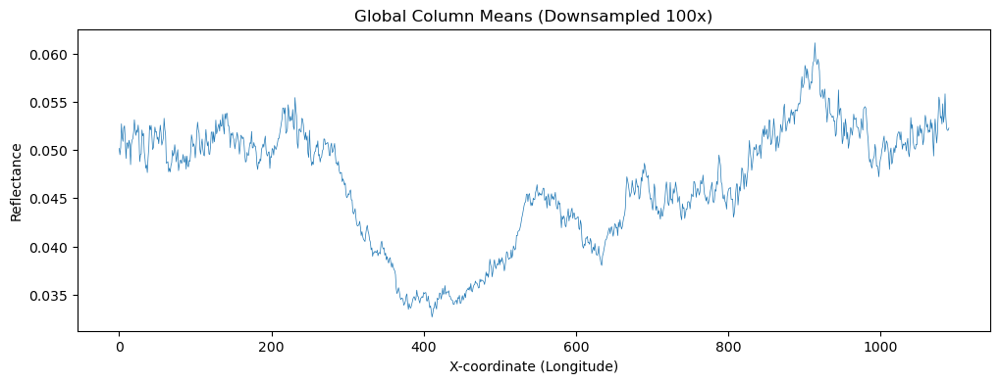

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio

def fast_stat_check(image_path):
    with rasterio.open(image_path) as src:
        # 'out_shape' tells rasterio to downsample while reading
        # We read 1/100th of the resolution (10km scale)
        h, w = src.height // 100, src.width // 100
        data = src.read(1, out_shape=(h, w), resampling=rasterio.enums.Resampling.average)
        
    # Convert to float for math
    data = data.astype(float)
    
    # Check for "Orbit Strips" (Vertical patterns)
    col_means = np.mean(data, axis=0)
    
    plt.figure(figsize=(12, 4))
    plt.plot(col_means, lw=0.5)
    plt.title("Global Column Means (Downsampled 100x)")
    plt.xlabel("X-coordinate (Longitude)")
    plt.ylabel("Reflectance")
    plt.show()

fast_stat_check("data/raw/wac_mosaic_new_version/WAC_GLOBAL_100m_180.tif")

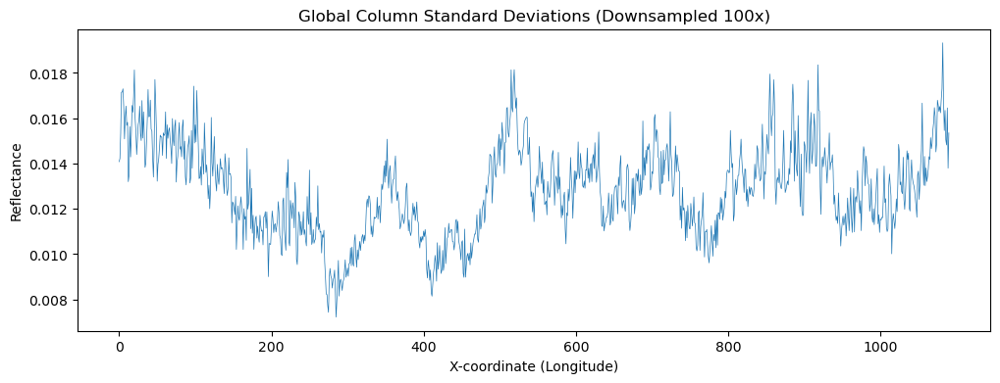

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio

def fast_stat_check(image_path):
    with rasterio.open(image_path) as src:
        # 'out_shape' tells rasterio to downsample while reading
        # We read 1/100th of the resolution (10km scale)
        h, w = src.height // 100, src.width // 100
        data = src.read(1, out_shape=(h, w), resampling=rasterio.enums.Resampling.average)
        
    # Convert to float for math
    data = data.astype(float)
    
    # Check for "Orbit Strips" (Vertical patterns)
    col_means = np.std(data, axis=0)
    
    plt.figure(figsize=(12, 4))
    plt.plot(col_means, lw=0.5)
    plt.title("Global Column Standard Deviations (Downsampled 100x)")
    plt.xlabel("X-coordinate (Longitude)")
    plt.ylabel("Reflectance")
    plt.show()

fast_stat_check("data/raw/wac_mosaic_new_version/WAC_GLOBAL_100m_180.tif")

Memmap size (bytes): 205087977472
Number of craters in memmap: 1021843

Visualizing random samples...


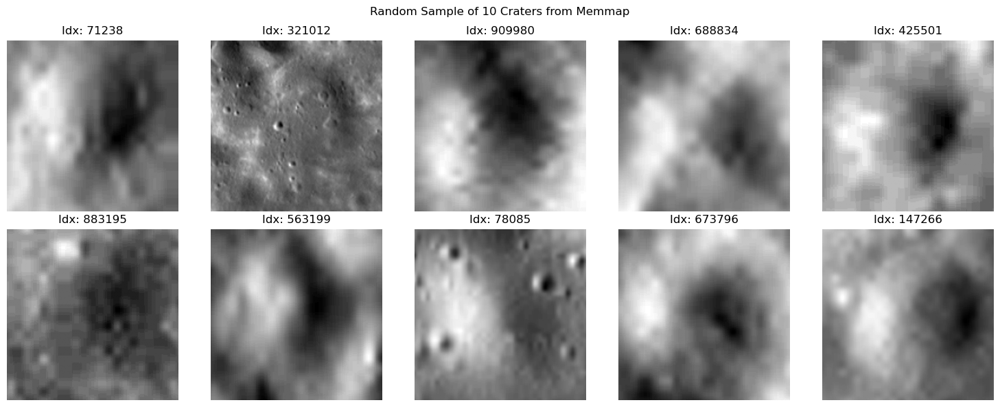

In [6]:
# Path to your combined craters .npy memmap
npy_path = "data/processed_filter/cae/craters.npy"  # adjust for mae/cae

# Check if file exists
if not os.path.exists(npy_path):
    print("File not found:", npy_path)
else:
    # Open memmap
    # NOTE: If this was saved using np.save(), consider using: np.load(npy_path, mmap_mode='r')
    crater_memmap = np.memmap(npy_path, mode='r', dtype=np.float32)
    
    # Each crater is stored as (channels, 224, 224)
    channels, H, W = 1, 224, 224  # adjust for mae: channels=3
    
    # Compute total number of craters
    total_craters = crater_memmap.size // (channels * H * W)
    print(f"Memmap size (bytes): {crater_memmap.size * crater_memmap.dtype.itemsize}")
    print(f"Number of craters in memmap: {total_craters}")

    # --- NEW CODE START: Display 10 Craters ---
    if total_craters > 0:
        print("\nVisualizing random samples...")
        
        # Reshape the linear memmap to access individual images: (N, C, H, W)
        # We slice [:total*...] to ensure we don't include partial/garbage bytes at the end
        craters = crater_memmap[:total_craters * channels * H * W].reshape(total_craters, channels, H, W)

        # Select 10 random indices (or all if less than 10)
        num_samples = 10
        if total_craters < num_samples:
            indices = np.arange(total_craters)
        else:
            indices = np.random.choice(total_craters, num_samples, replace=False)

        # Create plot
        fig, axes = plt.subplots(2, 5, figsize=(15, 6))
        axes = axes.ravel()

        for i, idx in enumerate(indices):
            # Extract image. Shape is (C, H, W) -> e.g., (1, 224, 224)
            img = craters[idx]
            
            # Prepare for Matplotlib (needs H, W, C or just H, W)
            if channels == 1:
                img_disp = img.squeeze()  # Becomes (224, 224)
                cmap = 'gray'
            else:
                img_disp = np.transpose(img, (1, 2, 0))  # Becomes (224, 224, 3)
                cmap = None

            # Handle Float32 Display: 
            # If values are not 0-1, imshow normalizes automatically. 
            # If you want to force it, uncomment the next line:
            # img_disp = (img_disp - img_disp.min()) / (img_disp.max() - img_disp.min())

            axes[i].imshow(img_disp, cmap=cmap)
            axes[i].set_title(f"Idx: {idx}")
            axes[i].axis('off')

        plt.suptitle(f"Random Sample of {num_samples} Craters from Memmap")
        plt.tight_layout()
        plt.show()
    else:
        print("Memmap is empty or dimensions are incorrect.")

In [ ]:
craters_csv = "data/raw/lunar_crater_database_robbins_2018.csv"
craters = pd.read_csv(craters_csv)

# Apply your preprocessing filters
filtered = craters[
    (craters['DIAM_CIRC_IMG'] >= 1.0) &
    (craters['DIAM_CIRC_IMG'] <= 10.0) &  # adjust thresholds if needed
    (craters['LAT_CIRC_IMG'] >= -60) &
    (craters['LAT_CIRC_IMG'] <= 60)
]

print("Total craters in CSV:", len(craters))
print("Crater count after filters:", len(filtered))

In [ ]:
craters_csv = "data/raw/lunar_crater_database_robbins_2018.csv"
map_file = "data/raw/Lunar_LRO_LROC-WAC_Mosaic_global_100m_June2013.tif"

craters = pd.read_csv(craters_csv)
filtered = craters[
    (craters['DIAM_CIRC_IMG'] >= 1.0) &
    (craters['DIAM_CIRC_IMG'] <= 10.0) &
    (craters['LAT_CIRC_IMG'] >= -60) &
    (craters['LAT_CIRC_IMG'] <= 60)
]

craters_crs = get_craters_crs()
processed_count = 0

with rasterio.open(map_file) as map_ref:
    transformer = pyproj.Transformer.from_crs(craters_crs, map_ref.crs.to_string(), always_xy=True)
    
    for _, crater in tqdm(filtered.iterrows(), total=len(filtered)):
        try:
            crop = crop_crater(map_ref, crater['LAT_CIRC_IMG'], crater['LON_CIRC_IMG'], crater['DIAM_CIRC_IMG'], 0.5, transformer)
            if crop is not None and crop.size > 0:
                processed_count += 1
        except:
            pass

print(f"Filtered craters: {len(filtered)}")
print(f"Successfully processed craters: {processed_count}")


In [ ]:

# Test MAE crops (RGB)
quick_test_preprocessing('data/processed_filter/mae/crater_crops', 'mae_craters_stats.npz', num_samples=20)

In [ ]:
# Simply call compare_clusters - it handles everything internally!
results = compare_clusters(
    technique='tsne',           # Visualization technique
    cluster_method='kmeans',    # Clustering method
    n_clusters=2,             # Number of clusters
    use_gpu=False,              # Set to True if you have GPU support
    out_dir="logs/cae/1.0_10.0_50_40/results",
    combine_labels=True,
    
)

# Results dictionary contains all metrics
print("\n=== SUMMARY ===")
print(f"ARI: {results['standard_metrics']['ari']:.3f}")
print(f"Procrustes disparity: {results['structural_similarity']['procrustes_disparity']:.4f}")
print(f"Distance correlation: {results['structural_similarity']['distance_correlation']:.3f}")
print(f"V-Measure: {results['structural_similarity']['v_measure']:.3f}")
print(f"Silhouette (predicted): {results['structural_similarity']['pred_silhouette']:.3f}")
print(f"Silhouette (ground truth): {results['structural_similarity']['gt_silhouette']:.3f}")
print(f"Boundary uncertainty: {results['continuum_evidence']['boundary_uncertainty']:.3f}")

In [ ]:
# Simply call compare_clusters - it handles everything internally!
results = compare_clusters(
    technique='tsne',           # Visualization technique
    cluster_method='agglomerative',    # Clustering method
    n_clusters=2,             # Number of clusters
    use_gpu=False,              # Set to True if you have GPU support
    out_dir="logs/mae/facebook/vit-mae-large/nofreeze_50_facemae_0.75_lower_lr_dataset_norm/results/",
    combine_labels=False
)

# Results dictionary contains all metrics
print("\n=== SUMMARY ===")
print(f"ARI: {results['standard_metrics']['ari']:.3f}")
print(f"Procrustes disparity: {results['structural_similarity']['procrustes_disparity']:.4f}")
print(f"Distance correlation: {results['structural_similarity']['distance_correlation']:.3f}")
print(f"V-Measure: {results['structural_similarity']['v_measure']:.3f}")
print(f"Silhouette (predicted): {results['structural_similarity']['pred_silhouette']:.3f}")
print(f"Silhouette (ground truth): {results['structural_similarity']['gt_silhouette']:.3f}")
print(f"Boundary uncertainty: {results['continuum_evidence']['boundary_uncertainty']:.3f}")

In [ ]:
# Simply call compare_clusters - it handles everything internally!
results = compare_clusters(
    technique='pca',           # Visualization technique
    cluster_method='kmeans',    # Clustering method
    n_clusters=2,             # Number of clusters
    use_gpu=False,              # Set to True if you have GPU support
    out_dir="logs/mae/facebook/vit-mae-large/nofreeze_50_facemae_0.75_lower_lr_dataset_norm/results/",
    combine_labels=True
)

# Results dictionary contains all metrics
print("\n=== SUMMARY ===")
print(f"ARI: {results['standard_metrics']['ari']:.3f}")
print(f"Procrustes disparity: {results['structural_similarity']['procrustes_disparity']:.4f}")
print(f"Distance correlation: {results['structural_similarity']['distance_correlation']:.3f}")
print(f"V-Measure: {results['structural_similarity']['v_measure']:.3f}")
print(f"Silhouette (predicted): {results['structural_similarity']['pred_silhouette']:.3f}")
print(f"Silhouette (ground truth): {results['structural_similarity']['gt_silhouette']:.3f}")
print(f"Boundary uncertainty: {results['continuum_evidence']['boundary_uncertainty']:.3f}")

In [ ]:
# Simply call compare_clusters - it handles everything internally!
results = compare_clusters(
    technique='tsne',           # Visualization technique
    cluster_method='agglomerative',    # Clustering method
    n_clusters=3,             # Number of clusters
    use_gpu=False,              # Set to True if you have GPU support
    out_dir="logs/cae/facebook/vit-mae-large/0_50_40/results"
)

# Results dictionary contains all metrics
print("\n=== SUMMARY ===")
print(f"ARI: {results['standard_metrics']['ari']:.3f}")
print(f"Procrustes disparity: {results['structural_similarity']['procrustes_disparity']:.4f}")
print(f"Distance correlation: {results['structural_similarity']['distance_correlation']:.3f}")
print(f"V-Measure: {results['structural_similarity']['v_measure']:.3f}")
print(f"Silhouette (predicted): {results['structural_similarity']['pred_silhouette']:.3f}")
print(f"Silhouette (ground truth): {results['structural_similarity']['gt_silhouette']:.3f}")
print(f"Boundary uncertainty: {results['continuum_evidence']['boundary_uncertainty']:.3f}")

In [ ]:
# Simply call compare_clusters - it handles everything internally!
results = compare_clusters(
    technique='umap',           # Visualization technique
    cluster_method='kmeans',    # Clustering method
    n_clusters=3,             # Number of clusters
    use_gpu=False,              # Set to True if you have GPU support
    out_dir="logs/cnn_latent40_l2_sched_pca/results/"
)

# Results dictionary contains all metrics
print("\n=== SUMMARY ===")
print(f"ARI: {results['standard_metrics']['ari']:.3f}")
print(f"Procrustes disparity: {results['structural_similarity']['procrustes_disparity']:.4f}")
print(f"Distance correlation: {results['structural_similarity']['distance_correlation']:.3f}")
print(f"V-Measure: {results['structural_similarity']['v_measure']:.3f}")
print(f"Silhouette (predicted): {results['structural_similarity']['pred_silhouette']:.3f}")
print(f"Silhouette (ground truth): {results['structural_similarity']['gt_silhouette']:.3f}")
print(f"Boundary uncertainty: {results['continuum_evidence']['boundary_uncertainty']:.3f}")

Original latent dim: 40
Finished Clustering! Clustering method: kmeans, Number of clusters: 4
[PCA] Total variance explained (PC1+PC2): 31.98%
Saved plots to logs/cae/sigma50_1.0_10.0_25_40/results/
Found 4 clusters

Cluster 0: 35 samples

Cluster 1: 38 samples

Cluster 2: 40 samples

Cluster 3: 37 samples

Figure saved to: logs/cae/sigma50_1.0_10.0_25_40/results/craters_examples_by_cluster.png


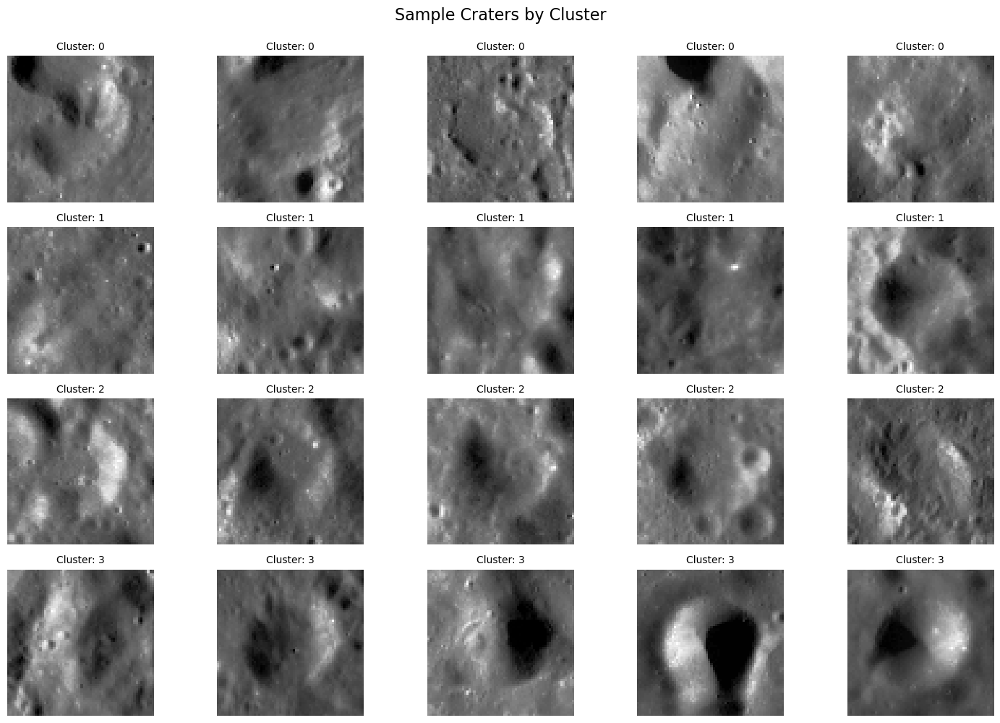

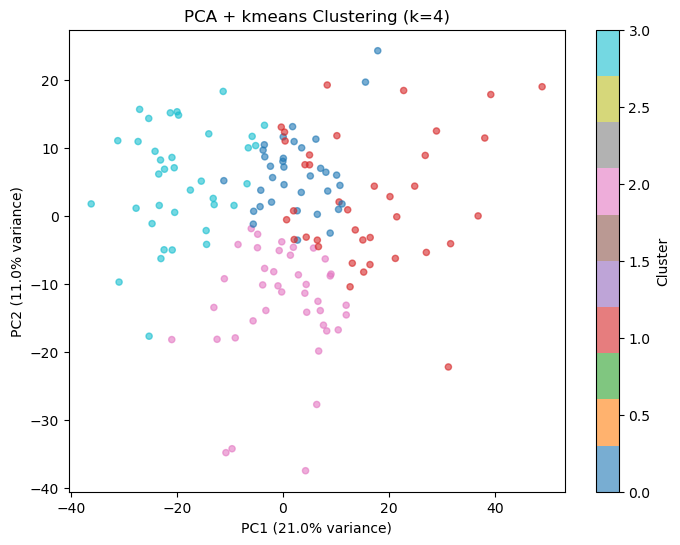

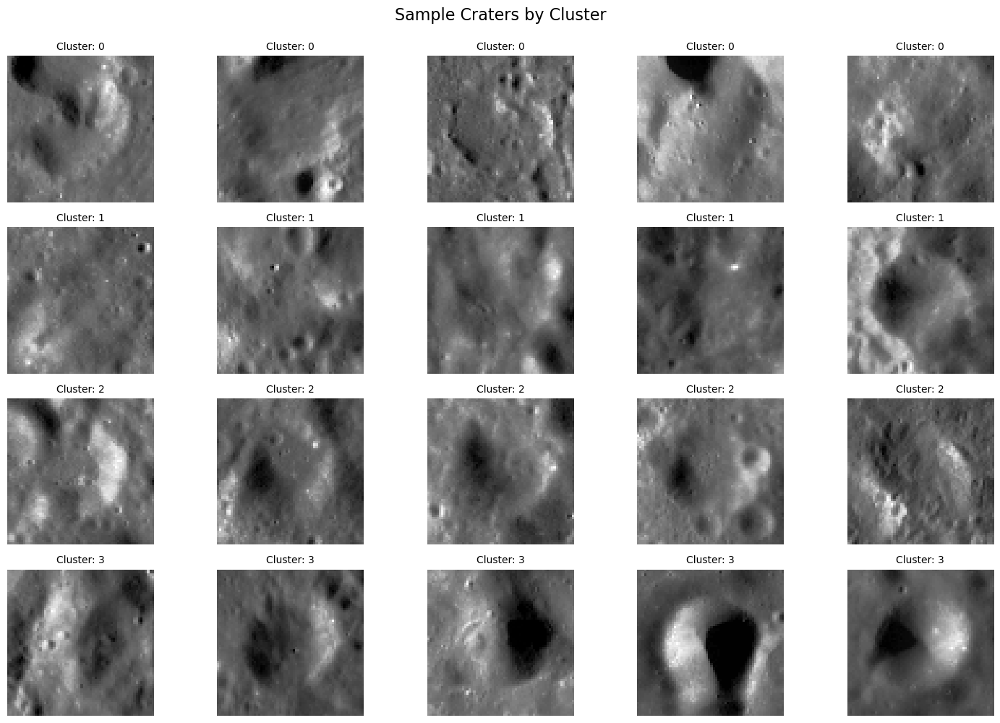

In [7]:
STATE_LABELS = {
    1: "New Crater",
    2: "Semi New Crater",
    3: "Semi Old Crater",
    4: "Old Crater"
}
STATE_COLORS = {
    1: "tab:blue",
    2: "tab:green",
    3: "tab:orange",
    4: "tab:red"
}

# Run clustering with ground truth visualization
_, _, _, labels = cluster_and_plot(
    latent="logs/cae/sigma50_1.0_10.0_25_40/results/latents.npy",
    technique='pca',
    cluster_method='kmeans',
    n_clusters=4,
    save_path="logs/cae/sigma50_1.0_10.0_25_40/results/"
)

display_craters_by_cluster(
    cluster_labels=labels,
    imgs_dir="data/raw/craters_for_danny",
    samples_per_cluster=5,
    save_path="logs/cae/sigma50_1.0_10.0_25_40/results/craters_examples_by_cluster.png"
)


In [ ]:
STATE_LABELS = {
    1: "New Crater",
    2: "Semi New Crater",
    3: "Semi Old Crater",
    4: "Old Crater"
}
STATE_COLORS = {
    1: "tab:blue",
    2: "tab:green",
    3: "tab:orange",
    4: "tab:red"
}

# Load ground truth labels
ground_truth = np.load("logs/cnn_latent40_l2_sched_1_10/results/states.npy").squeeze()  # .squeeze() to remove extra dimensions

# Run clustering with ground truth visualization
fig_gmm, fig_gt, coords, labels = cluster_and_plot(
    latent="logs/cnn_latent40_l2_sched_1_10/results/latents.npy",
    technique='umap',
    cluster_method='kmeans',
    n_clusters=4,
    save_path="logs/cnn_latent40_l2_sched_1_10/results/",
    ground_truth_labels=ground_truth,
    state_labels=STATE_LABELS,
    state_colors=STATE_COLORS,
    imgs_dir="data/raw/craters_for_danny"  # or provide path if you want image scatter
)

display_craters_by_cluster(
    cluster_labels=labels,
    imgs_dir="data/raw/craters_for_danny",
    samples_per_cluster=5,
    save_path="logs/cnn_latent40_l2_sched_1_10/results/craters_examples_by_cluster.png"
)


In [ ]:
# Define new combined state labels
COMBINED_STATE_LABELS = {
    1: "New/Semi-New Crater",  # Combines states 1 and 2
    2: "Old/Semi-Old Crater"    # Combines states 3 and 4
}

COMBINED_STATE_COLORS = {
    1: "tab:blue",
    2: "tab:red"
}

# Load ground truth labels
ground_truth = np.load("logs/cnn_latent40_l2_sched_pca/results/states.npy").squeeze()

# Remap the labels to combine states
# Map: 1->1, 2->1, 3->2, 4->2
label_mapping = {1: 1, 2: 1, 3: 2, 4: 2}
combined_ground_truth = np.array([label_mapping[label] for label in ground_truth])

# Run clustering with combined ground truth visualization
fig_gmm, fig_gt, coords, labels = cluster_and_plot(
    latent="logs/cnn_latent40_l2_sched_pca/results/latents.npy",
    technique='tsne',
    cluster_method='kmeans',
    n_clusters=2,  # Changed to 2 since you now have 2 combined states
    save_path="logs/cae_latent40_l2_sched_pca/results/",
    ground_truth_labels=combined_ground_truth,
    state_labels=COMBINED_STATE_LABELS,
    state_colors=COMBINED_STATE_COLORS,
    imgs_dir="data/raw/craters_for_danny"
)

In [ ]:
STATE_LABELS = {
    1: "New Crater",
    2: "Semi New Crater",
    3: "Semi Old Crater",
    4: "Old Crater"
}
STATE_COLORS = {
    1: "tab:blue",
    2: "tab:green",
    3: "tab:orange",
    4: "tab:red"
}

# Load ground truth labels
ground_truth = np.load("logs/mae/facebook/vit-mae-large/nofreeze_50_facemae_0.75_lower_lr_dataset_norm/results/states.npy").squeeze()  # .squeeze() to remove extra dimensions

# Run clustering with ground truth visualization
fig_gmm, fig_gt, coords, labels = cluster_and_plot(
    latent="logs/mae/facebook/vit-mae-large/nofreeze_50_facemae_0.75_lower_lr_dataset_norm/results/latent_vectors.npy",
    technique='pca',
    cluster_method='kmeans',
    n_clusters=3,
    save_path="logs/mae/facebook/vit-mae-large/nofreeze_50_facemae_0.75_lower_lr_dataset_norm/results/",
    ground_truth_labels=ground_truth,
    state_labels=STATE_LABELS,
    state_colors=STATE_COLORS,
    reduce_latent_95=True,
    use_gpu=True)

In [ ]:
STATE_LABELS = {
    1: "New Crater",
    2: "Semi New Crater",
    3: "Semi Old Crater",
    4: "Old Crater"
}
STATE_COLORS = {
    1: "tab:blue",
    2: "tab:green",
    3: "tab:orange",
    4: "tab:red"
}

# Load ground truth labels
ground_truth = np.load("logs/cnn_latent40_l2_sched_500/results/states.npy").squeeze()  # .squeeze() to remove extra dimensions

# Run clustering with ground truth visualization
fig_gmm, fig_gt, coords, labels = cluster_and_plot(
    latent="logs/cnn_latent40_l2_sched_500/results/latents.npy",
    technique='umap',
    cluster_method='kmeans',
    n_clusters=3,
    save_path="logs/cnn_latent40_l2_sched_500/results/new_validation/",
    ground_truth_labels=ground_truth,
    state_labels=STATE_LABELS,
    state_colors=STATE_COLORS,
    imgs_dir="data/raw/craters_for_danny"  # or provide path if you want image scatter
)

In [ ]:
STATE_LABELS = {
    1: "New Crater",
    2: "Semi New Crater",
    3: "Semi Old Crater",
    4: "Old Crater"
}
STATE_COLORS = {
    1: "tab:blue",
    2: "tab:green",
    3: "tab:orange",
    4: "tab:red"
}

# Load ground truth labels
ground_truth = np.load("logs/cnn_latent40_l2_sched_1_10/results/states.npy").squeeze()  # .squeeze() to remove extra dimensions

# Run clustering with ground truth visualization
fig_gmm, fig_gt, coords, labels = cluster_and_plot(
    latent="logs/cnn_latent40_l2_sched_1_10/results/latents.npy",
    technique='umap',
    cluster_method='kmeans',
    n_clusters=3,
    save_path="logs/cnn_latent40_l2_sched_1_10/results/new_validation/",
    ground_truth_labels=ground_truth,
    state_labels=STATE_LABELS,
    state_colors=STATE_COLORS,
    imgs_dir="data/raw/craters_for_danny"  # or provide path if you want image scatter
)

In [ ]:
STATE_LABELS = {
    1: "New Crater",
    2: "Semi New Crater",
    3: "Semi Old Crater",
    4: "Old Crater"
}
STATE_COLORS = {
    1: "tab:blue",
    2: "tab:green",
    3: "tab:orange",
    4: "tab:red"
}

# Load ground truth labels
ground_truth = np.load("logs/cnn_latent40_l2_sched_pca/results/states.npy").squeeze()  # .squeeze() to remove extra dimensions

# Run clustering with ground truth visualization
fig_gmm, fig_gt, coords, labels = cluster_and_plot(
    latent="logs/cae/facebook/vit-mae-large/0_50_40/results/latents.npy",
    technique='pca',
    cluster_method='agglomerative',
    n_clusters=3,
    save_path="logs/cae/facebook/vit-mae-large/0_50_40/results/",
    ground_truth_labels=ground_truth,
    state_labels=STATE_LABELS,
    state_colors=STATE_COLORS,
    imgs_dir="data/raw/craters_for_danny"  # or provide path if you want image scatter
)

In [ ]:
STATE_LABELS = {
    1: "New Crater",
    2: "Semi New Crater",
    3: "Semi Old Crater",
    4: "Old Crater"
}
STATE_COLORS = {
    1: "tab:blue",
    2: "tab:green",
    3: "tab:orange",
    4: "tab:red"
}

# Load ground truth labels
ground_truth = np.load("logs/mae/facebook/vit-mae-large/nofreeze_50_facemae_0.75_lower_lr_dataset_norm/results/states_julie.npy").squeeze()  # .squeeze() to remove extra dimensions

# Run clustering with ground truth visualization
fig_gmm, fig_gt, coords, labels = cluster_and_plot(
    latent="logs/mae/facebook/vit-mae-large/nofreeze_50_facemae_0.75_lower_lr_dataset_norm/results/latents_julie_with_flip.npy",
    technique='tsne',
    cluster_method='agglomerative',
    n_clusters=3,
    save_path="logs/mae/facebook/vit-mae-large/nofreeze_50_facemae_0.75_lower_lr_dataset_norm/results/",
    ground_truth_labels=ground_truth,
    state_labels=STATE_LABELS,
    state_colors=STATE_COLORS,
    imgs_dir="data/raw/craters_for_danny"  # or provide path if you want image scatter
)

In [ ]:
STATE_LABELS = {
    1: "New Crater",
    2: "Semi New Crater",
    3: "Semi Old Crater",
    4: "Old Crater"
}
STATE_COLORS = {
    1: "tab:blue",
    2: "tab:green",
    3: "tab:orange",
    4: "tab:red"
}

# Load ground truth labels
ground_truth = np.load("logs/cae_latent40_l2_sched_1_10/results/states.npy").squeeze()  # .squeeze() to remove extra dimensions

# Run clustering with ground truth visualization
fig_gmm, fig_gt, coords, labels = cluster_and_plot(
    latent="logs/cae_latent40_l2_sched_1_10/results/latents.npy",
    technique='tsne',
    cluster_method='agglomerative',
    n_clusters=3,
    save_path="logs/cae_latent40_l2_sched_1_10/results/",
    ground_truth_labels=ground_truth,
    state_labels=STATE_LABELS,
    state_colors=STATE_COLORS,
    imgs_dir="data/raw/craters_for_danny"  # or provide path if you want image scatter
    )

In [ ]:
# Run clustering with ground truth visualization
_, _, _, labels = cluster_and_plot(
    latent="logs/mae/processed_sigma/200/julie_vectors.npy",
    technique='pca',
    cluster_method='kmeans',
    n_clusters=4,
    save_path="logs/mae/processed_sigma/200/"
)

display_craters_by_cluster(
    cluster_labels=labels,
    imgs_dir="data/raw/craters_for_danny",
    samples_per_cluster=5,
    save_path="logs/mae/processed_sigma/200/craters_examples_by_cluster.png"
)